# Leading PC Box Exploration in HW's

## Imports and Functions

In [6]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import xarray as xr
from sklearn.preprocessing import MinMaxScaler
import scipy as sp
import os
import sys

In [7]:
# Add the folder to the Python path

os.chdir("../")
# change working directory to project's root path
print(os.getcwd())

folder_path = os.path.abspath("functions/") #INPUT_PATH)#'path_to_your_folder')  # Replace with the actual folder path
sys.path.insert(0, folder_path)

c:\Users\marti\Desktop\data


In [8]:

from IndexDrivers import (
    MultivariatePCA, 
    plot_hw_index,
    plot_hw_index_by_season,
    scatter_color_year,
    scatter_color_season
)

In [9]:
def df_to_series(dataframe, name_series, years=[1979,2023]):
    selected = dataframe[(dataframe["Year"]< years[1]) & (dataframe["Year"] > years[0])]
    df_melted = selected.melt(id_vars=['Year'], var_name='Month', value_name=name_series)
    df_melted["Month"] = pd.to_numeric(df_melted["Month"])
    df_melted = df_melted.sort_values(['Year','Month'])

    df_melted['Date'] = pd.to_datetime(df_melted[['Year', 'Month']].assign(DAY=1))
    df_melted.set_index('Date', inplace=True)

    return df_melted.drop(columns=["Year", "Month"])

## PC-1 on MEI box and HWN/HWF

In [10]:
ds_5means = xr.load_dataset("data/local_data/5means.nc")
mei = MultivariatePCA(ds_5means, 3, [1980, 2022])

FileNotFoundError: [Errno 2] No such file or directory: 'c:\\Users\\marti\\Desktop\\data\\data\\local_data\\5means.nc'

In [ ]:
hwis = pd.read_csv("data/local_data/1978_2023_HWs.csv")
hwis["Date"] = pd.to_datetime(hwis["Date"],format='%Y-%m')
hwis.set_index('Date', inplace=True)

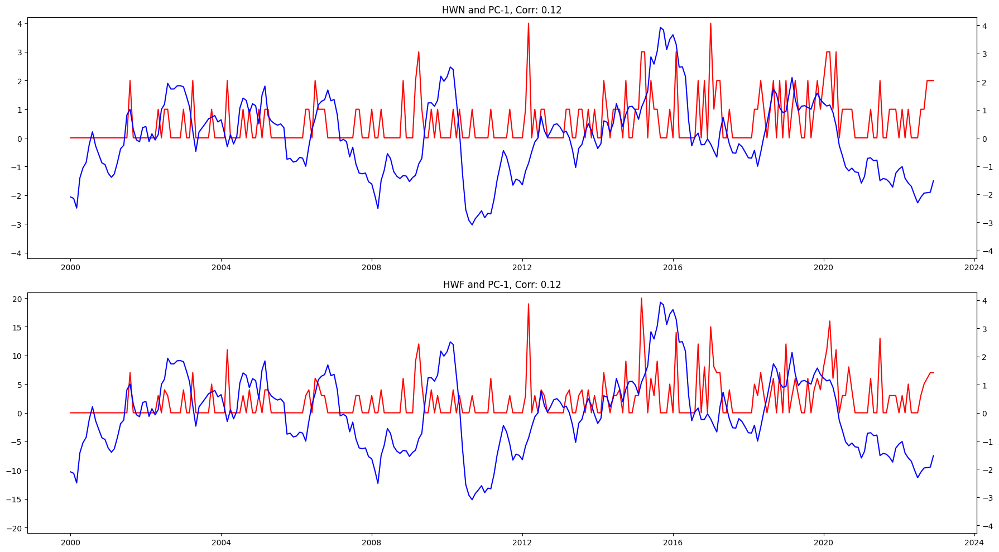

In [ ]:
plot_hw_index(hwis, ["HWN", "HWF"], mei, 1, start=2000)

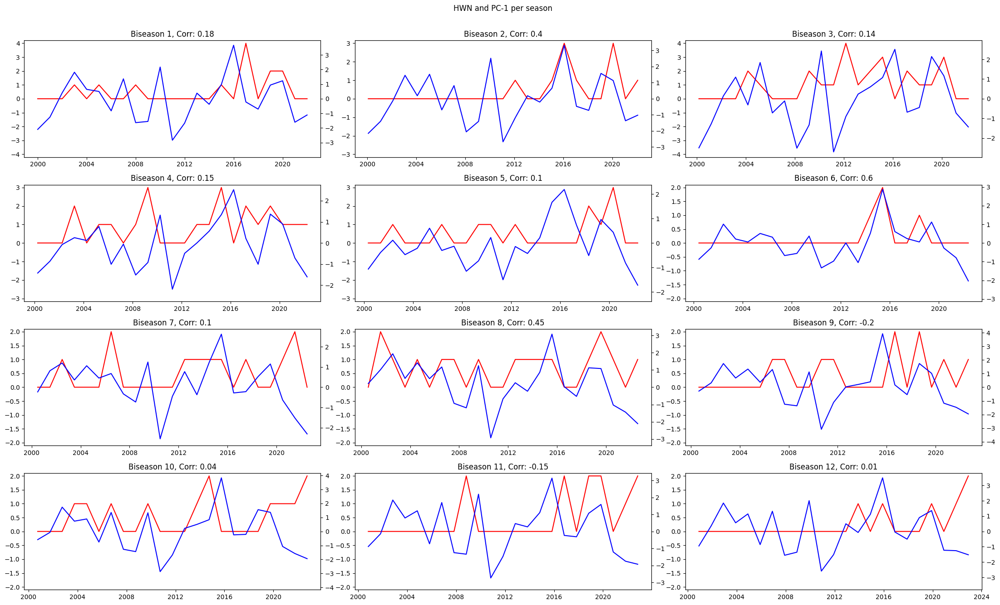

In [ ]:
plot_hw_index_by_season(hwis, "HWN", mei, 1, start=2000)

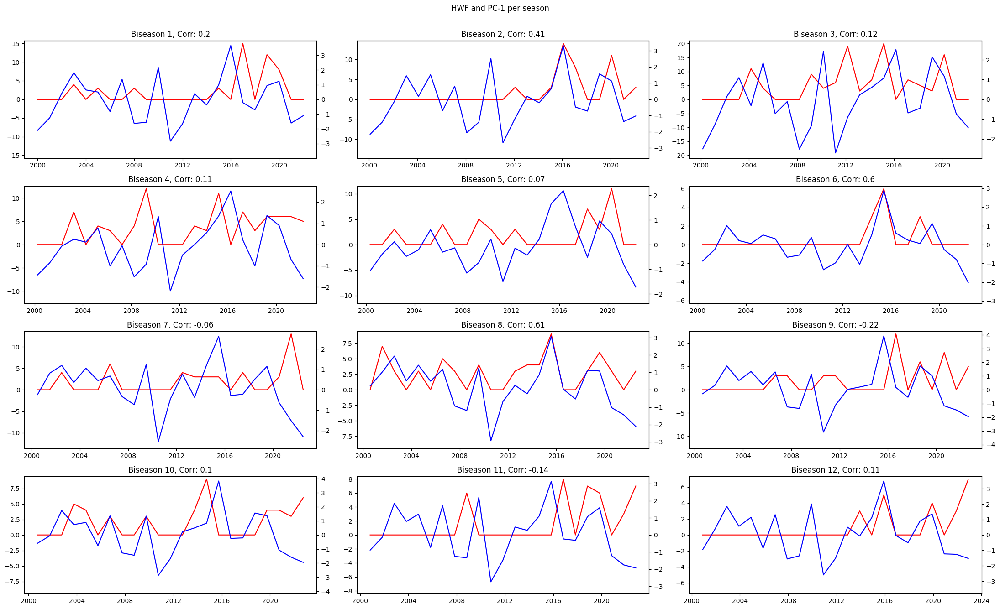

In [ ]:
plot_hw_index_by_season(hwis, "HWF", mei, 1, start=2000)

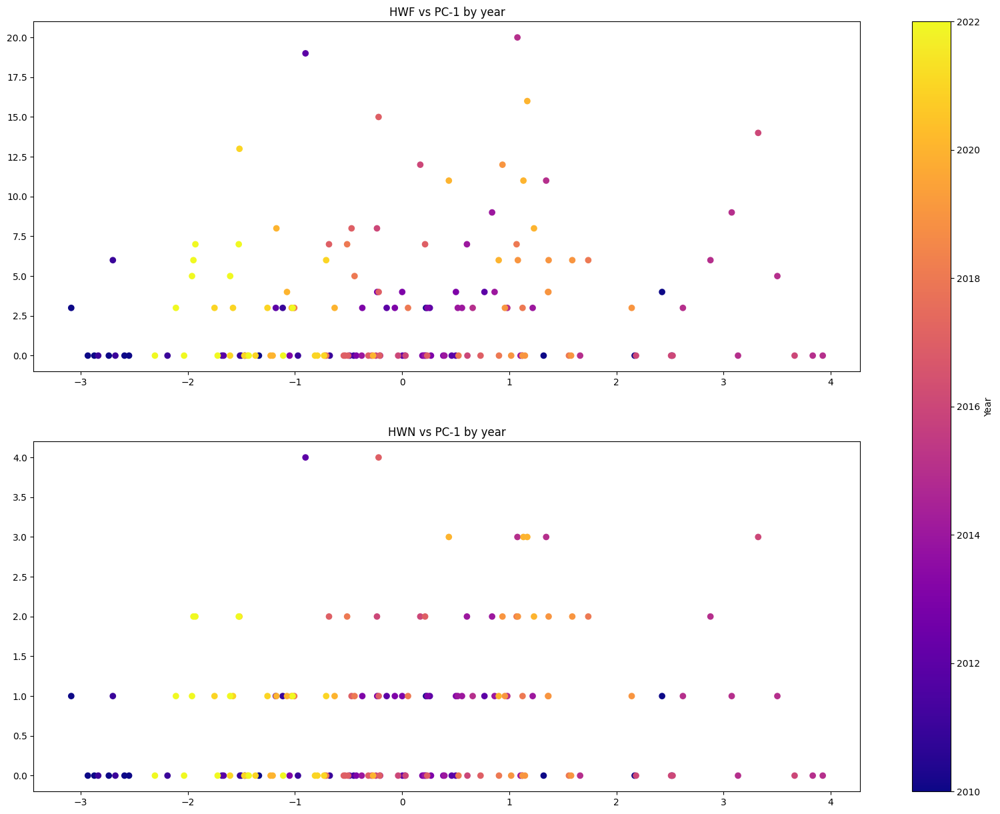

In [ ]:
scatter_color_year(hwis, ["HWF", "HWN"], mei, 1, start=2010)

## PC-2 on MEI box and HWN/HWF

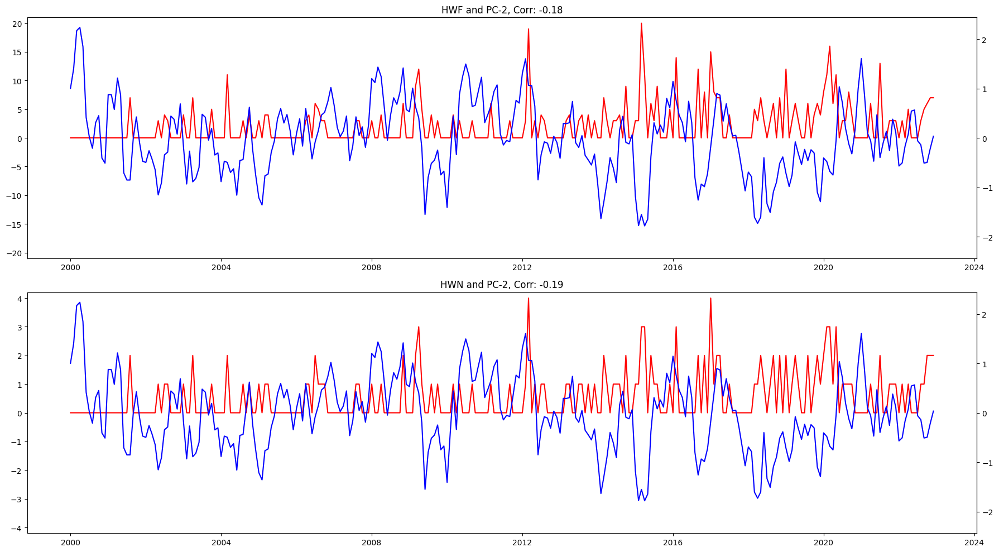

In [ ]:
plot_hw_index(hwis, ["HWF", "HWN"], mei, 2, start=2000)

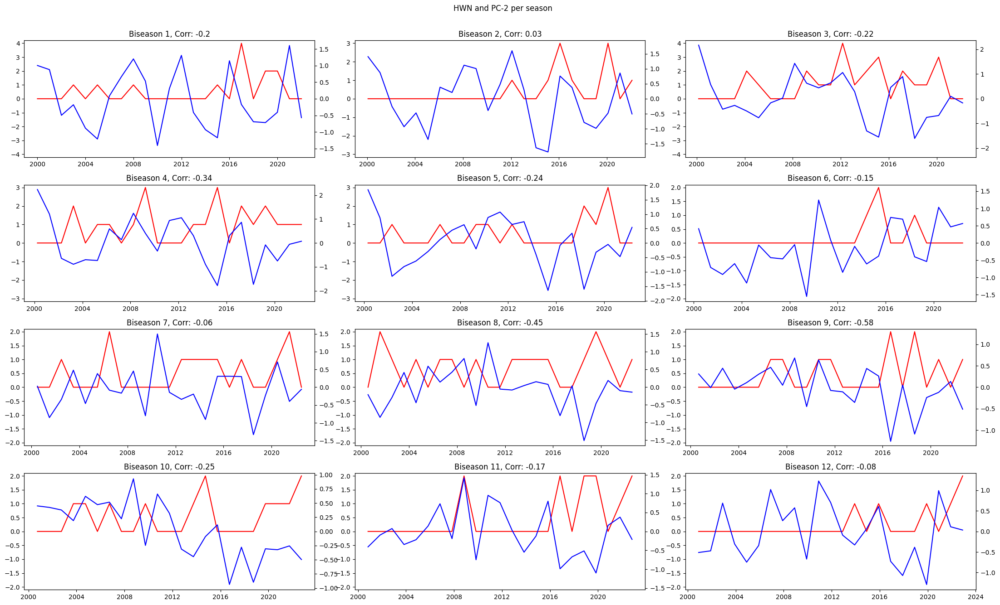

In [ ]:
plot_hw_index_by_season(hwis, "HWN", mei, 2, start=2000)

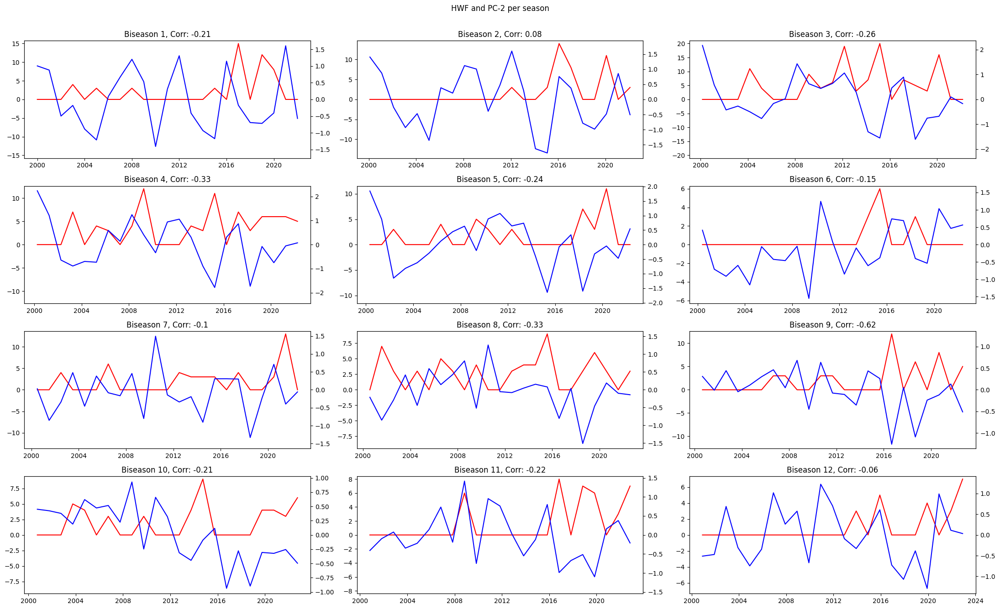

In [ ]:
plot_hw_index_by_season(hwis, "HWF", mei, 2, start=2000)

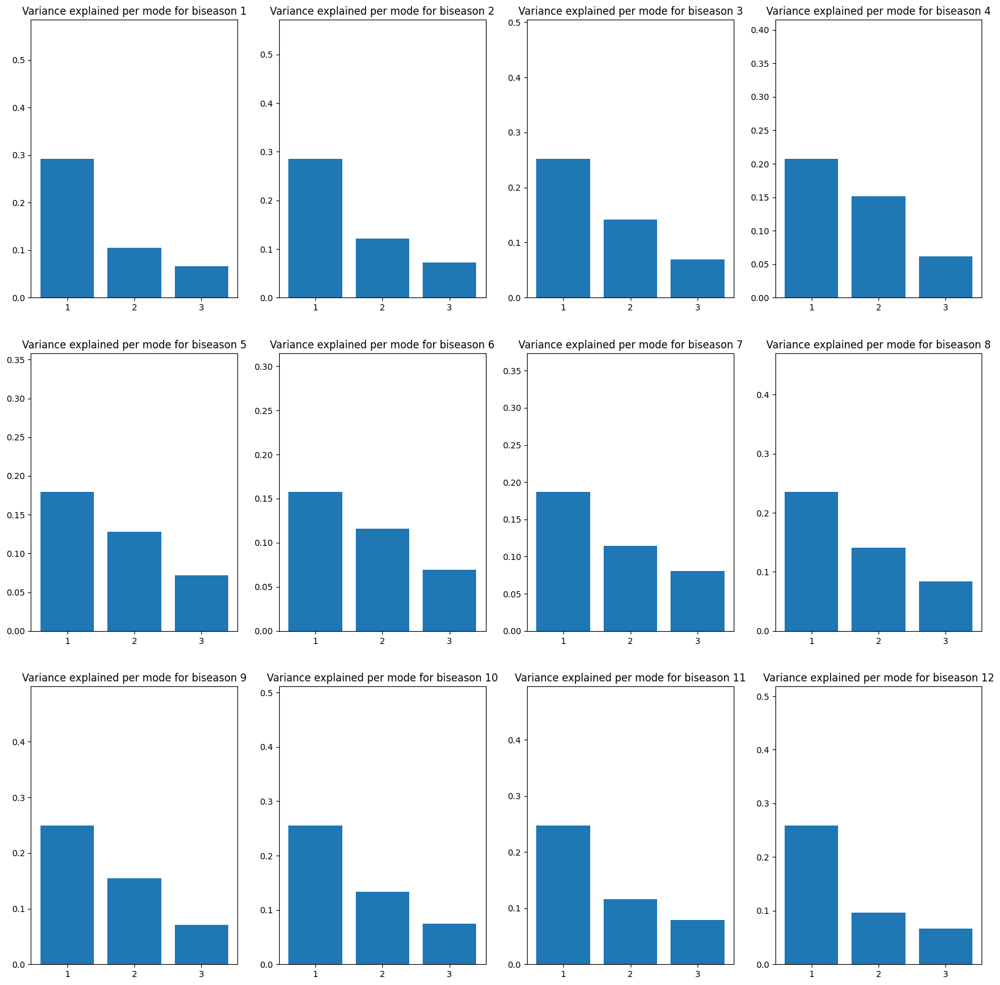

In [ ]:
mei.plot_explained_variance()

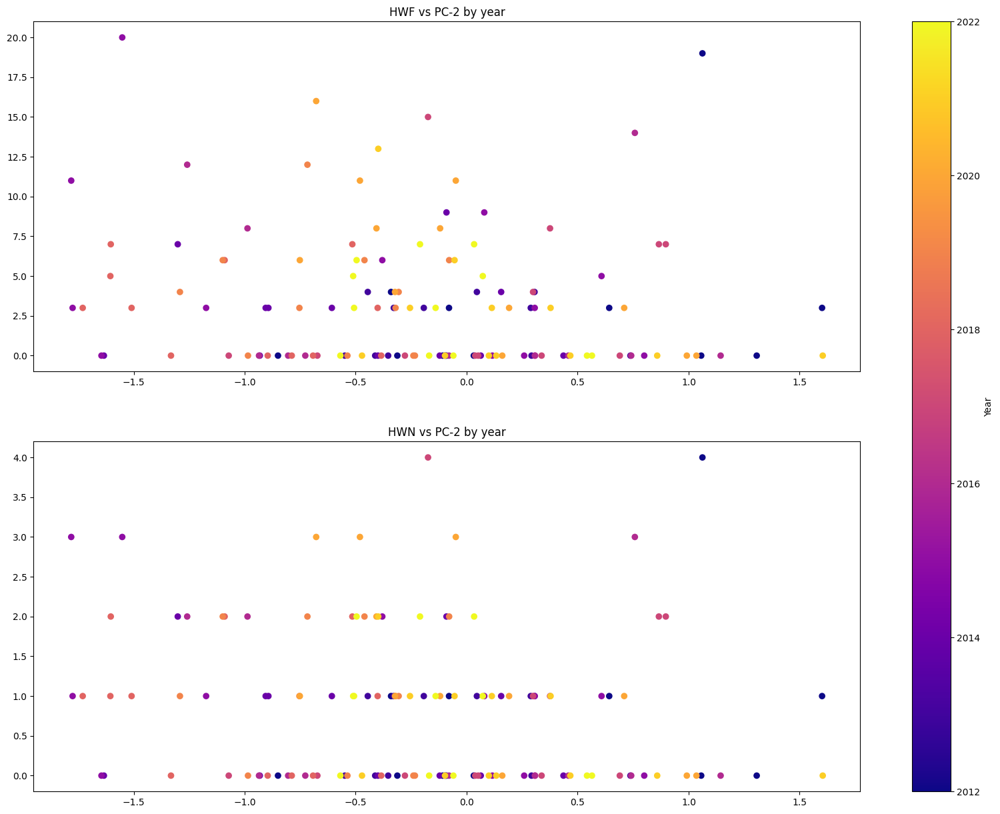

In [ ]:
scatter_color_year(hwis, ["HWF", "HWN"], mei, 2, start=2012)

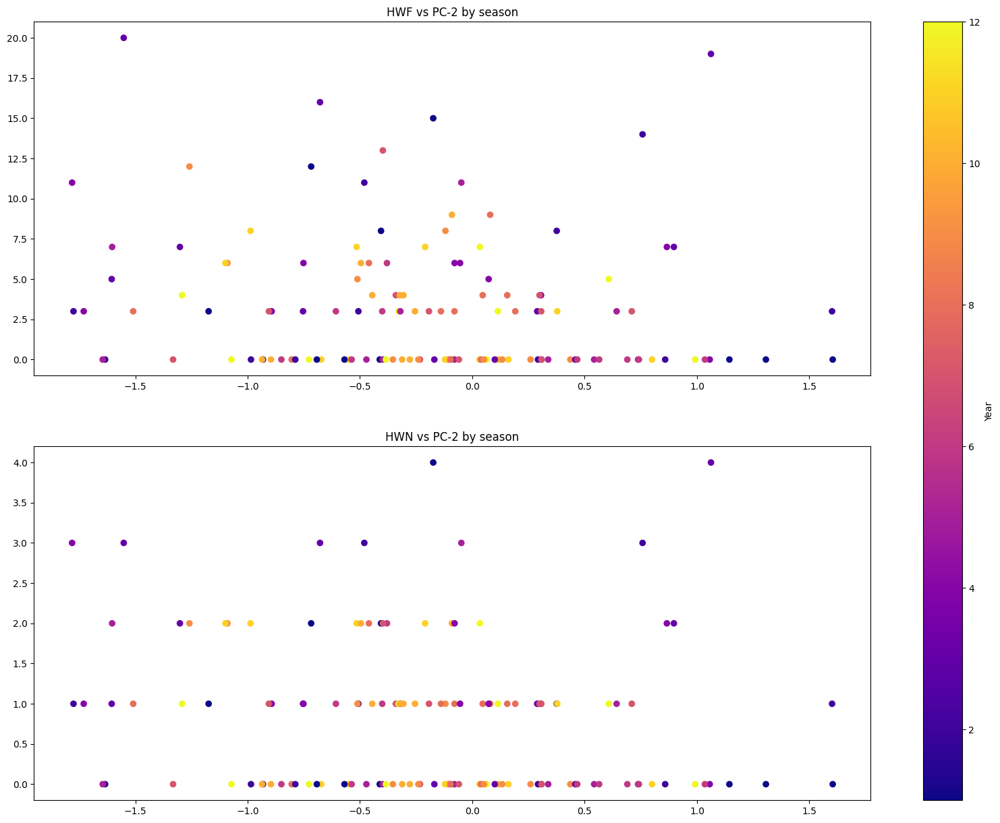

In [ ]:
scatter_color_season(hwis, ["HWF", "HWN"], mei, 2, start=2012)

Check same plots but using central chile (average over multiple stations, Hugo chose 10 stations with few lost data)

## PC-1 on World Boxes

,HWN,HWF
Date,,
1980-01-01,0.0,0.0
1980-02-01,0.0,0.0
1980-03-01,1.0,3.5
1980-04-01,1.0,3.5
1980-05-01,0.0,0.0
...,...,...
2022-08-01,0.5,1.5
2022-09-01,1.0,4.0
2022-10-01,1.5,5.5


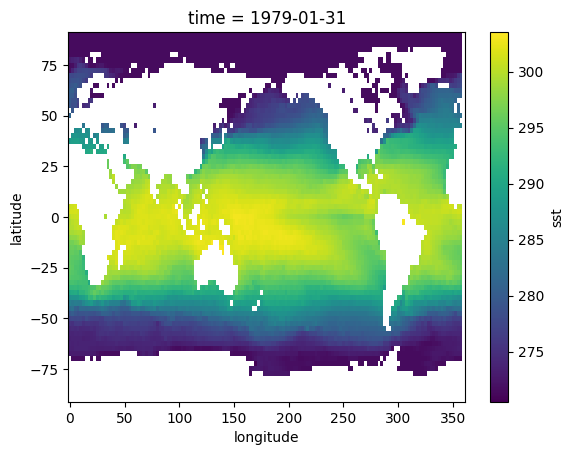

In [ ]:
ds_world = xr.load_dataset("data/local_data/5means_world.nc")
ds_world.sst.isel(time=0).plot()
hwis = pd.read_csv("data/local_data/1978_2023_HWs.csv")
hwis["Date"] = pd.to_datetime(hwis["Date"],format='%Y-%m')
hwis.set_index('Date', inplace=True)

## Rolling for biseasons
hwis = hwis.rolling(2).mean()[(hwis.index.year < 2023) & (hwis.index.year > 1979)]
hwis

In [ ]:
world_pca = MultivariatePCA(ds_world, 2, [1980,2022], box_limit=[0,360,-90,90])

c:\Users\marti\Desktop\data\hw_extra\functions\IndexDrivers.py:84: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  self.grid_shape = (self.data.dims["latitude"], self.data.dims["longitude"])


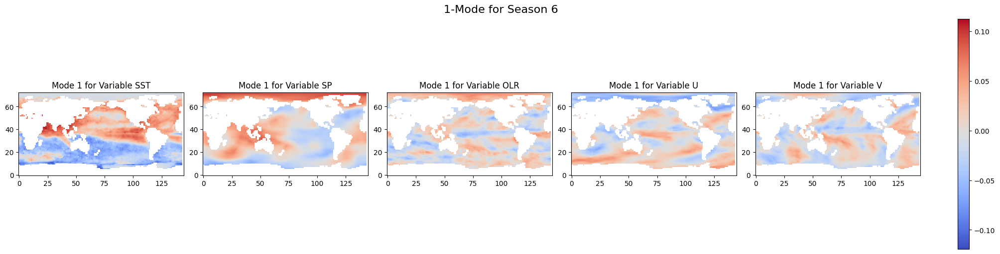

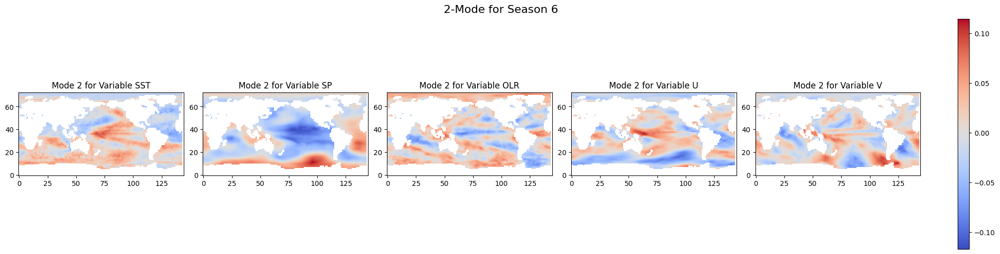

In [ ]:
world_pca.plot_variable_modes_shared(6)

### PC-1 world

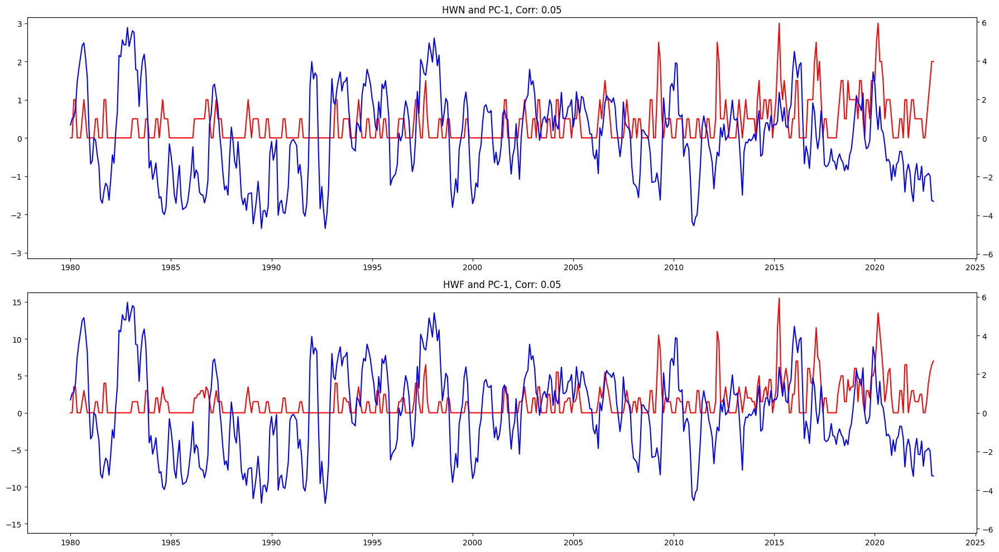

In [ ]:
plot_hw_index(hwis, ["HWN", "HWF"], world_pca, 1)

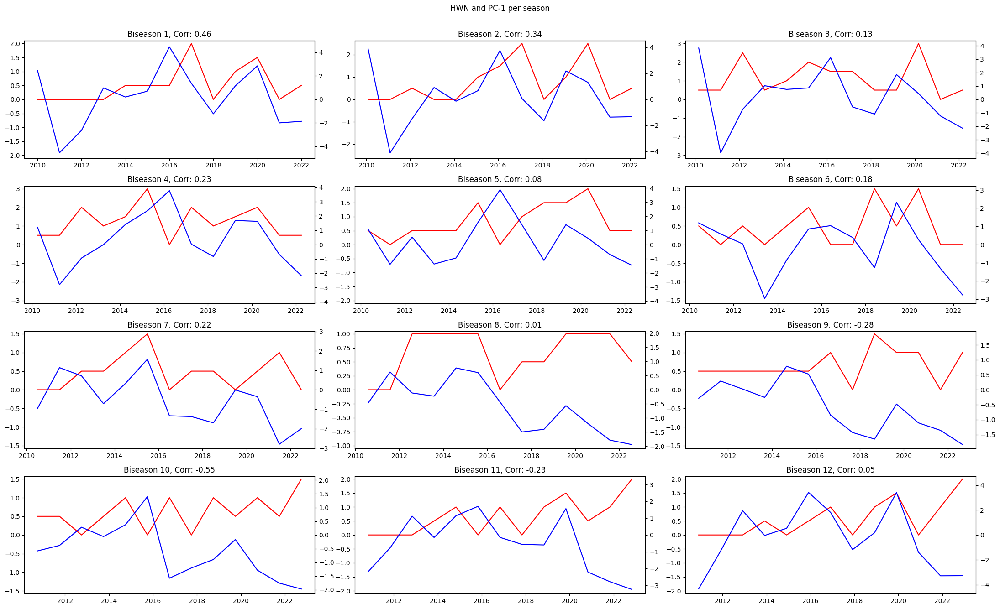

In [ ]:
plot_hw_index_by_season(hwis, "HWN", world_pca, 1, start=2010)

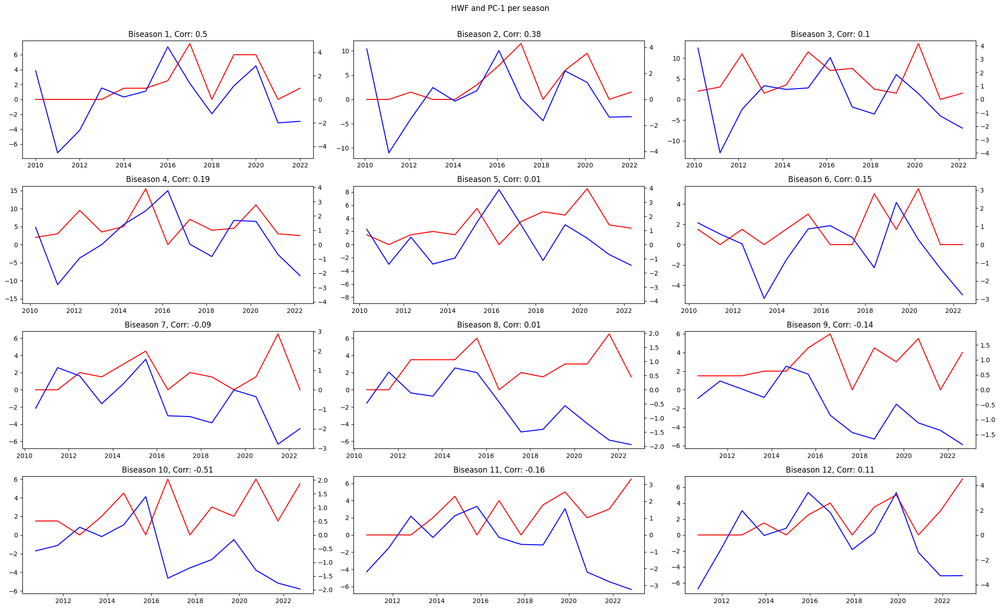

In [ ]:
plot_hw_index_by_season(hwis, "HWF", world_pca, 1, start=2010)

Magnitude from correlations between series considerably increase when considering only last decade. 

### PC-2 World

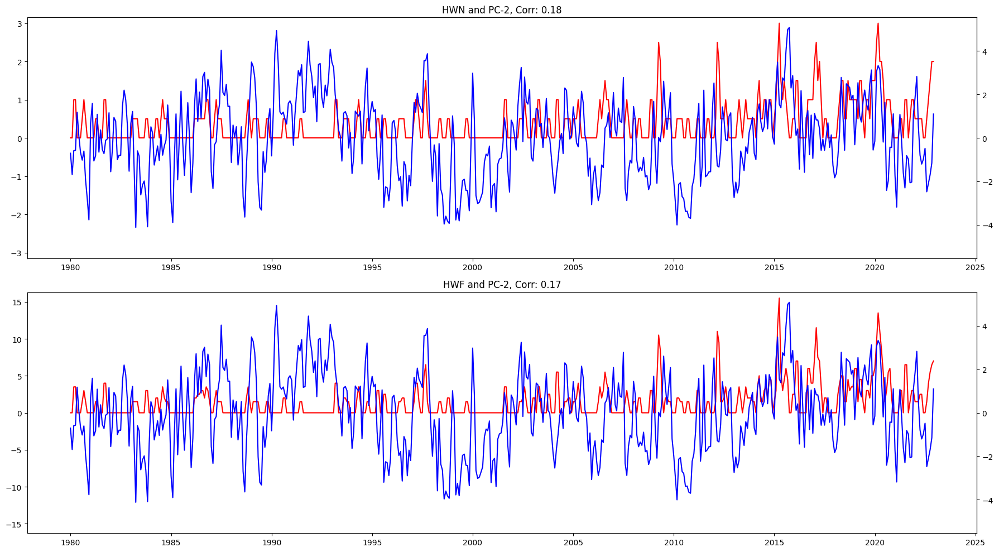

In [ ]:
plot_hw_index(hwis, ["HWN", "HWF"], world_pca, 2, start=1980)

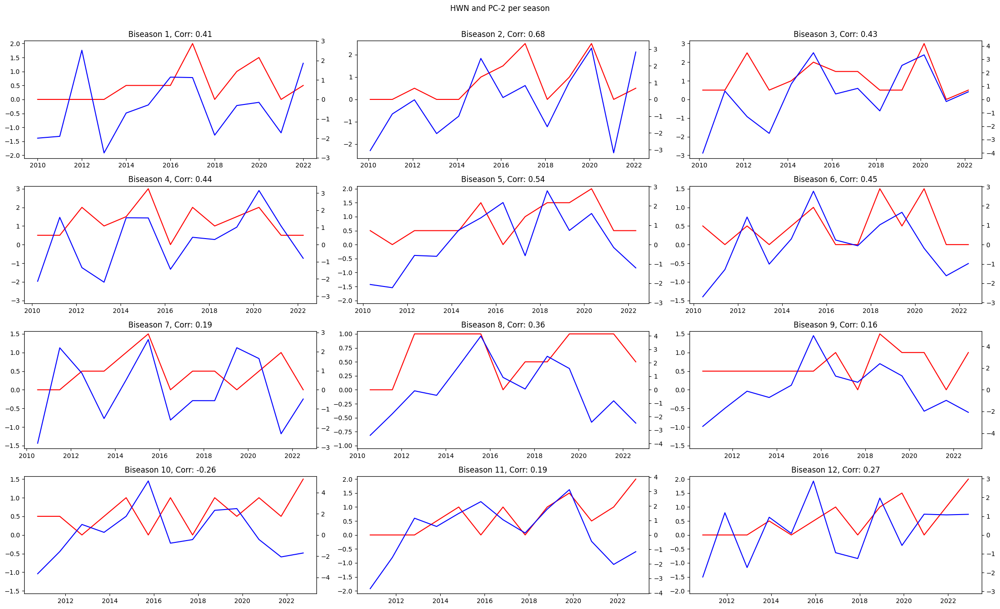

In [ ]:
plot_hw_index_by_season(hwis, "HWN", world_pca, 2, start=2010)

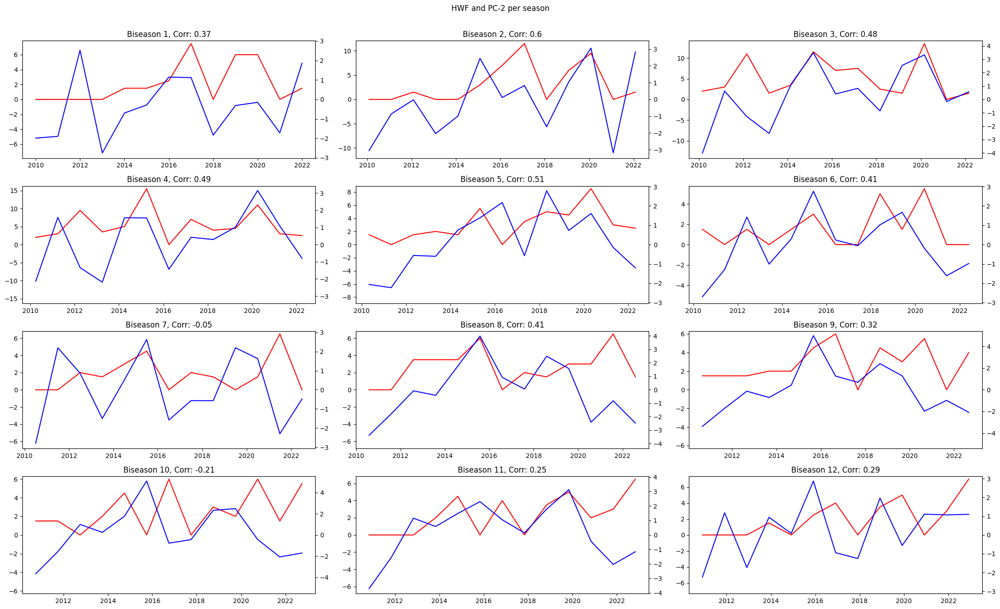

In [ ]:
plot_hw_index_by_season(hwis, "HWF", world_pca, 2, start=2010)

Magnitude from correlations between series considerably increase when considering only last decade. This increases when we analyze the PC-2 and HW's.

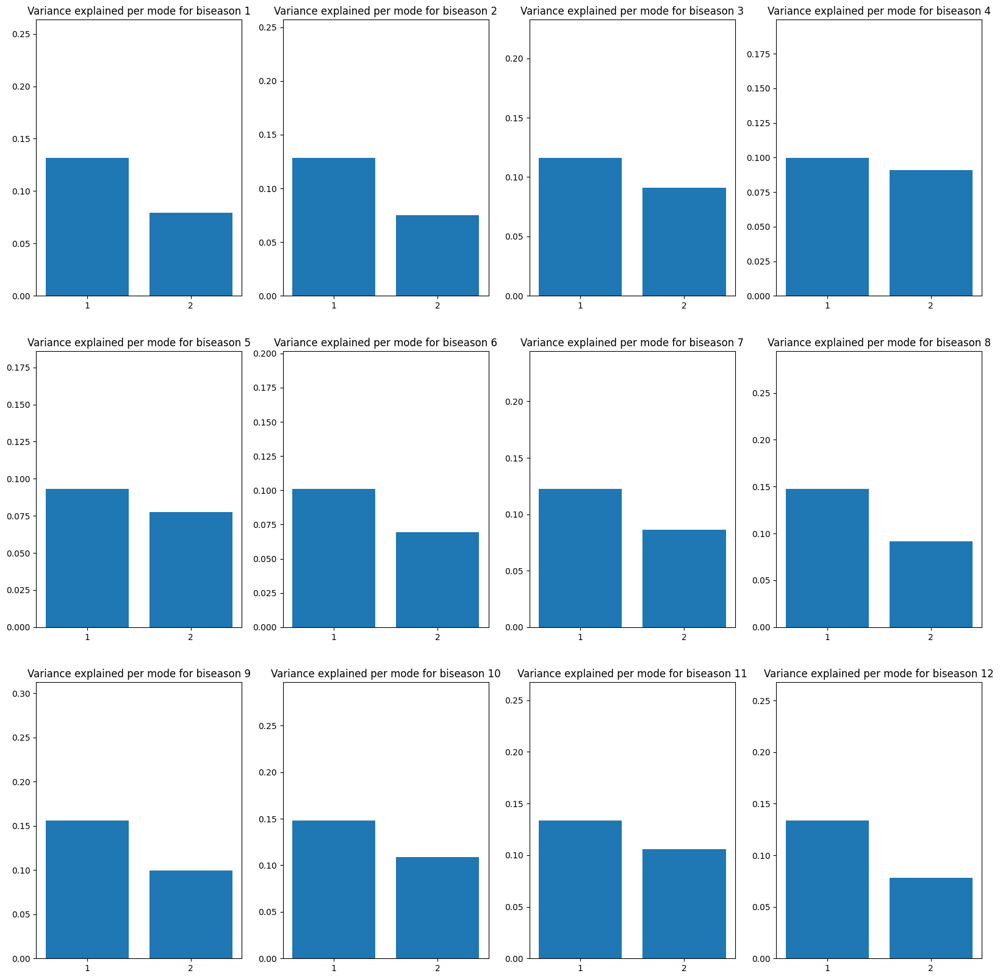

In [ ]:
world_pca.plot_explained_variance()

## Exploration

### PDO using [100,290,20,90]

c:\Users\marti\Desktop\data\hw_extra\functions\IndexDrivers.py:84: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  self.grid_shape = (self.data.dims["latitude"], self.data.dims["longitude"])


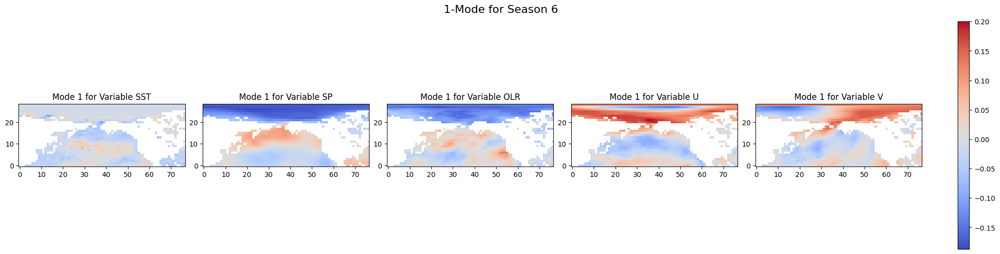

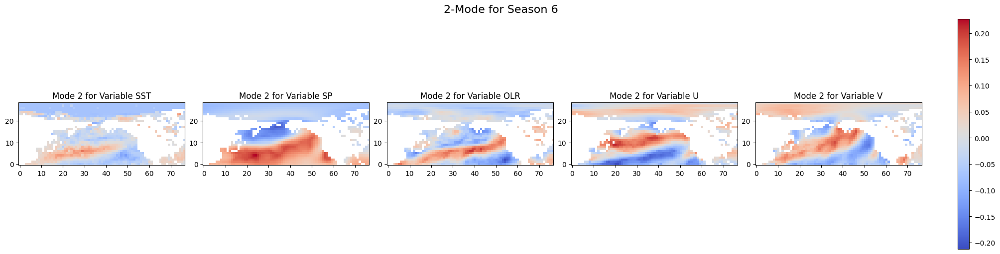

In [ ]:
ds_world = xr.load_dataset("data/local_data/5means_world.nc")
pdo_pca = MultivariatePCA(ds_world, 2, [1980,2022], box_limit=[100,290,20,90])
pdo_pca.plot_variable_modes_shared(6)

PDO is using 20S,60N.

In [ ]:
col_labels = ["Year", "1", "2", "3", "4", "5", "6", "7", "8", "9", "10", "11", "12"]
df_pdo = pd.read_csv("data/indices/pdo.data",sep="     |    |   |  ", header=None, engine="python", names=col_labels)
df_pdo = df_to_series(df_pdo, "PDO")

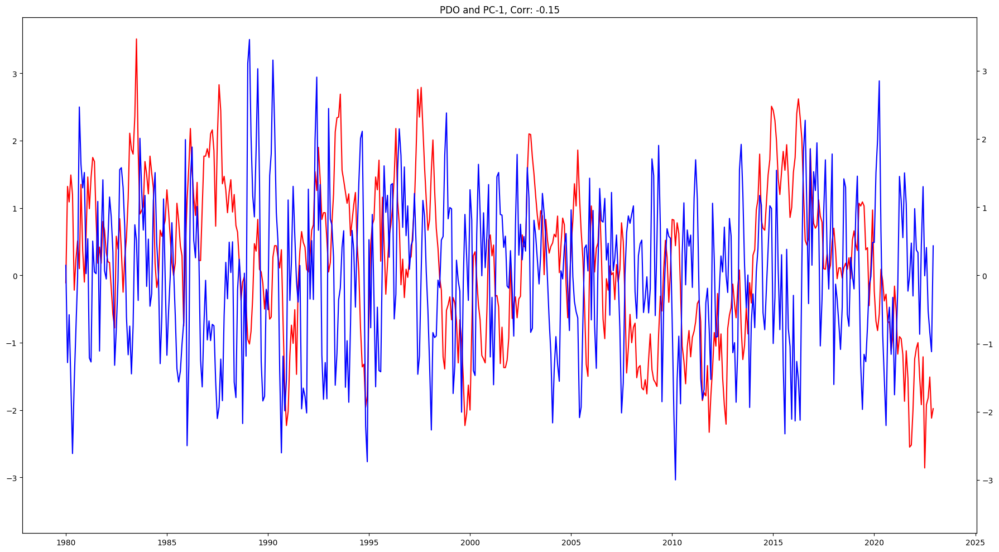

In [ ]:
plot_hw_index(df_pdo, ["PDO"], pdo_pca, 1)

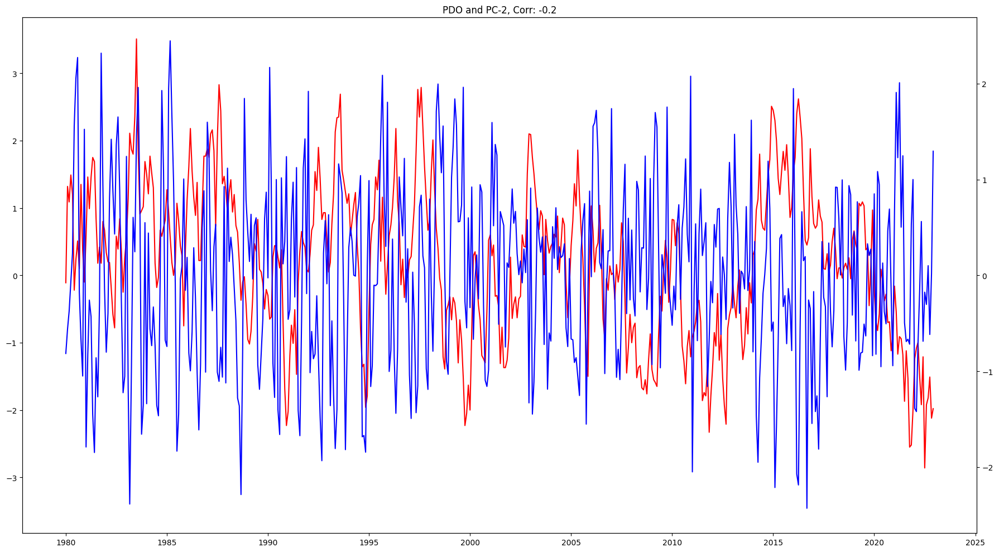

In [ ]:
plot_hw_index(df_pdo, ["PDO"], pdo_pca, 2)

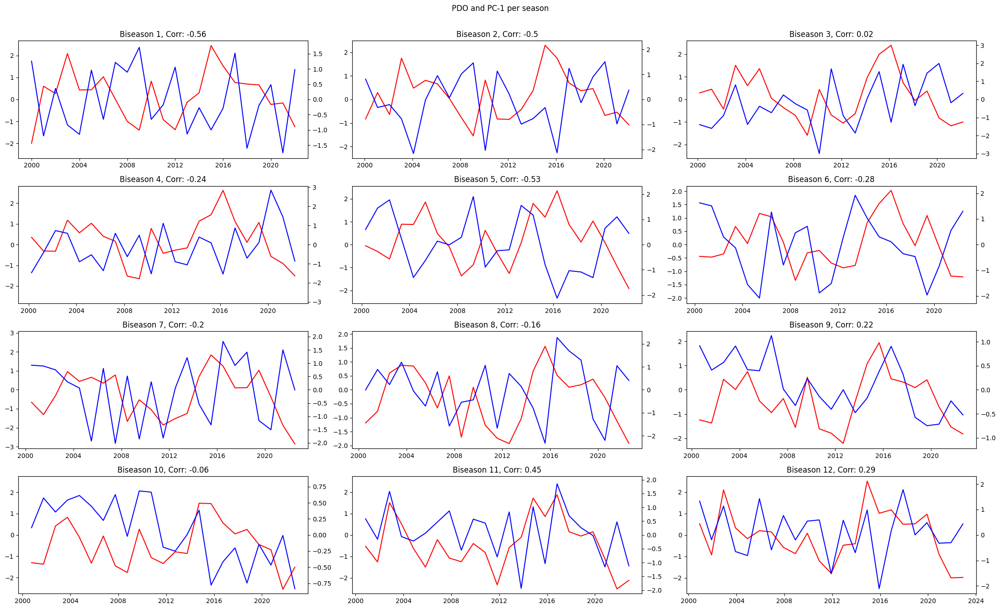

In [ ]:
plot_hw_index_by_season(df_pdo, "PDO", pdo_pca, 1, start=2000)

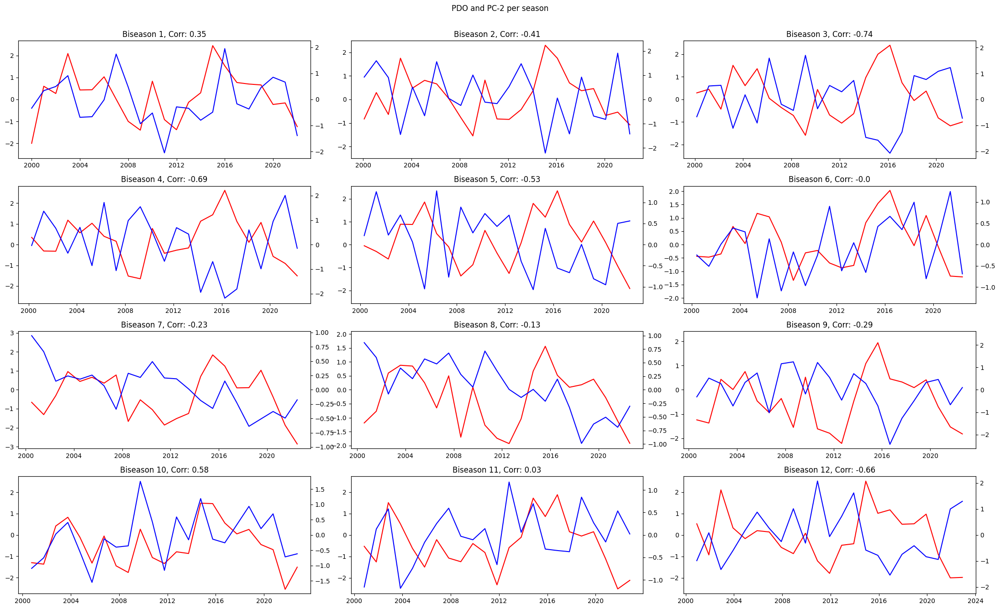

In [ ]:
plot_hw_index_by_season(df_pdo, "PDO", pdo_pca, 2, start=2000)

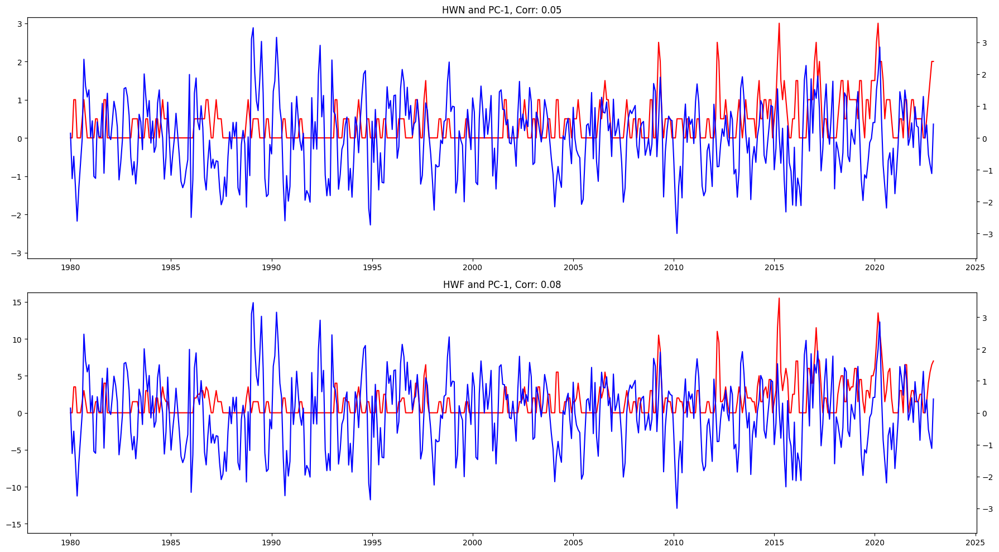

In [ ]:
plot_hw_index(hwis, ["HWN", "HWF"], pdo_pca, 1)

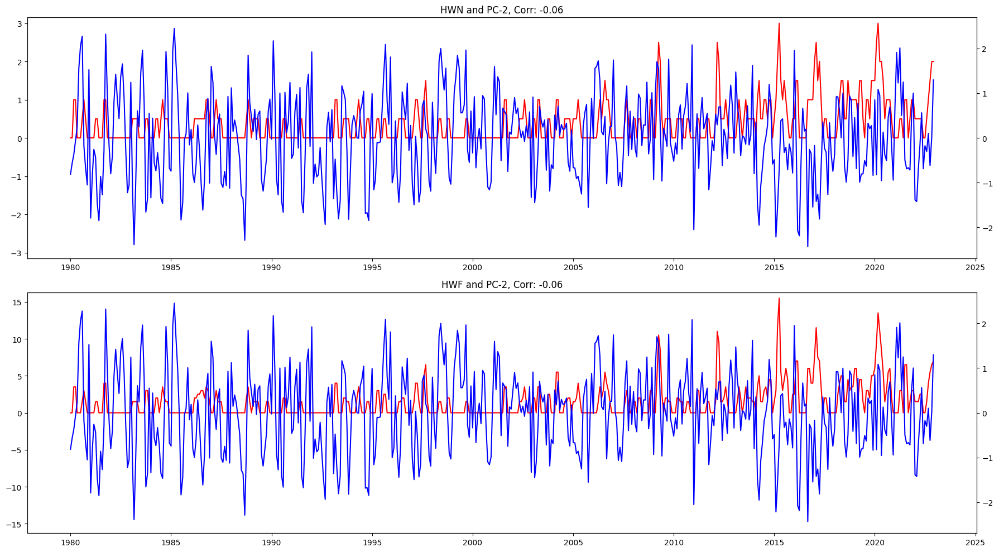

In [ ]:
plot_hw_index(hwis, ["HWN", "HWF"], pdo_pca, 2)

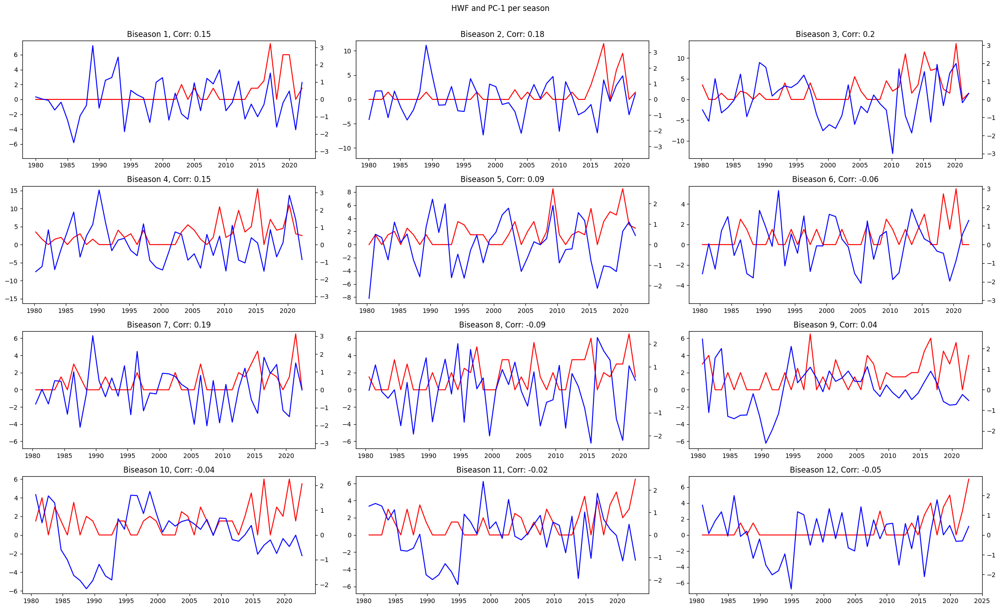

In [ ]:
plot_hw_index_by_season(hwis, "HWF", pdo_pca, 1)

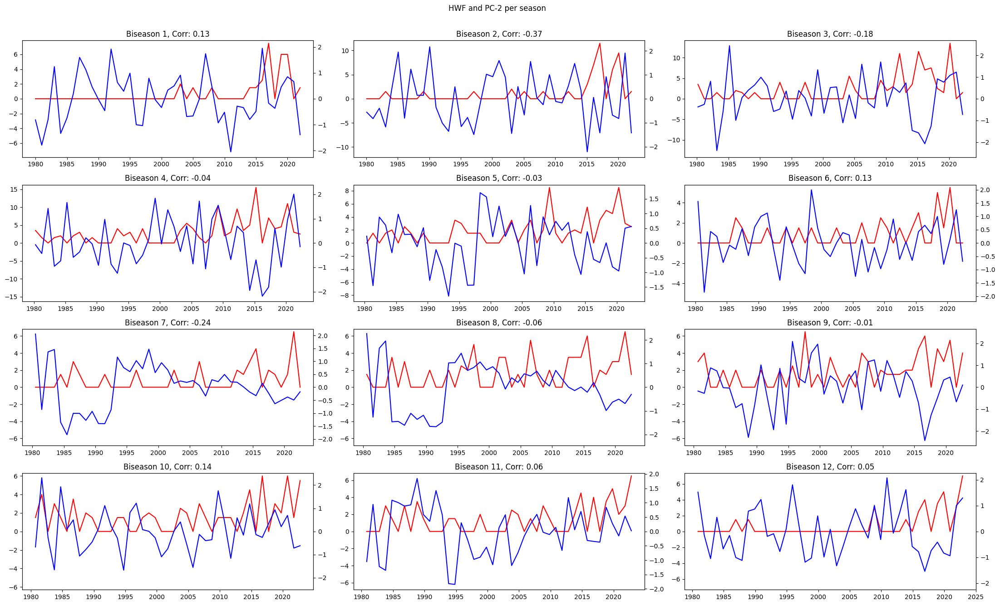

In [ ]:
plot_hw_index_by_season(hwis, "HWF", pdo_pca, 2)

### Box using [100,290,-90,-20]

c:\Users\marti\Desktop\data\hw_extra\functions\IndexDrivers.py:84: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  self.grid_shape = (self.data.dims["latitude"], self.data.dims["longitude"])


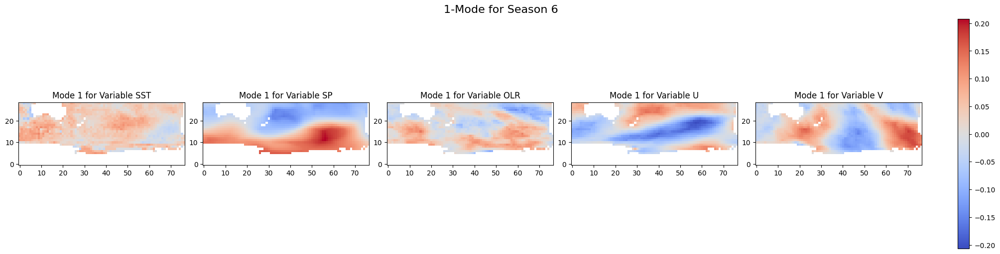

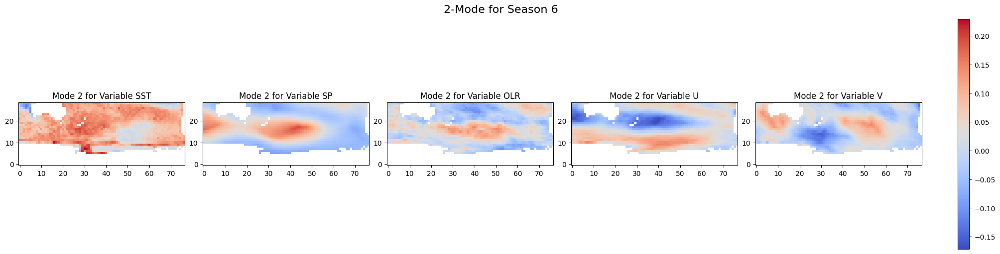

In [ ]:
ds_world = xr.load_dataset("data/local_data/5means_world.nc")
south_pca = MultivariatePCA(ds_world, 2, [1980,2022], box_limit=[100,290,-90,-20])
south_pca.plot_variable_modes_shared(6)

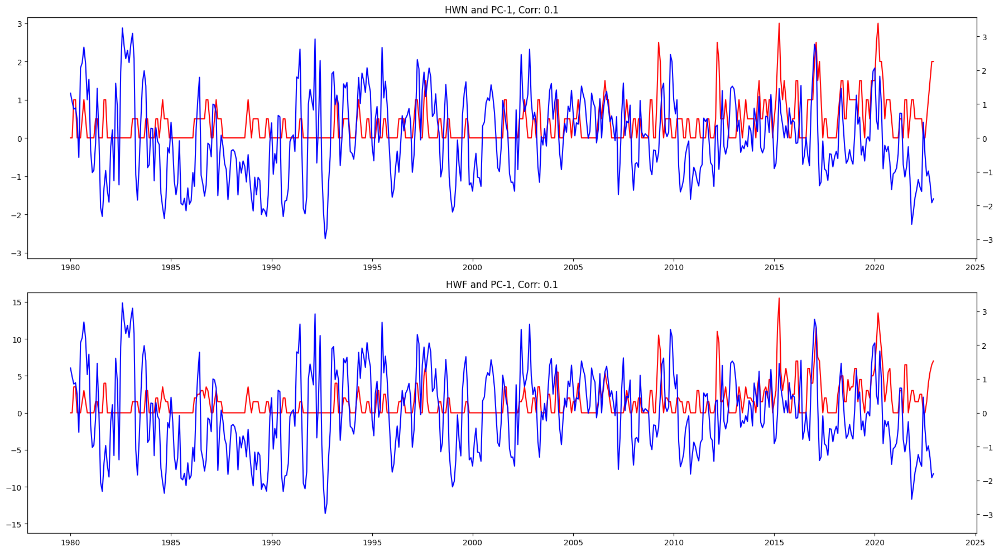

In [ ]:
plot_hw_index(hwis, ["HWN", "HWF"], south_pca, 1)

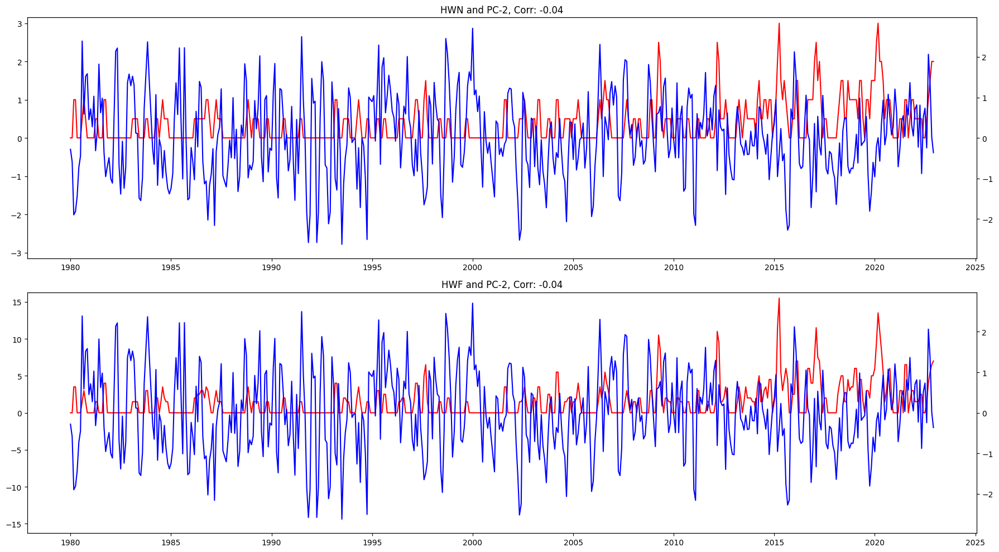

In [ ]:
plot_hw_index(hwis, ["HWN", "HWF"], south_pca, 2)

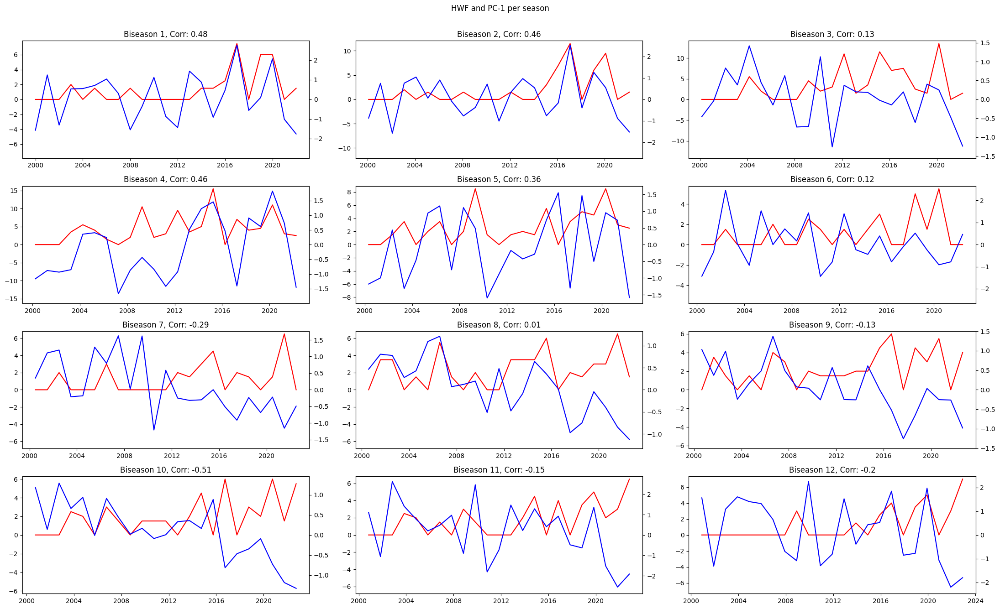

In [ ]:
plot_hw_index_by_season(hwis, "HWF", south_pca, 1, start=2000)

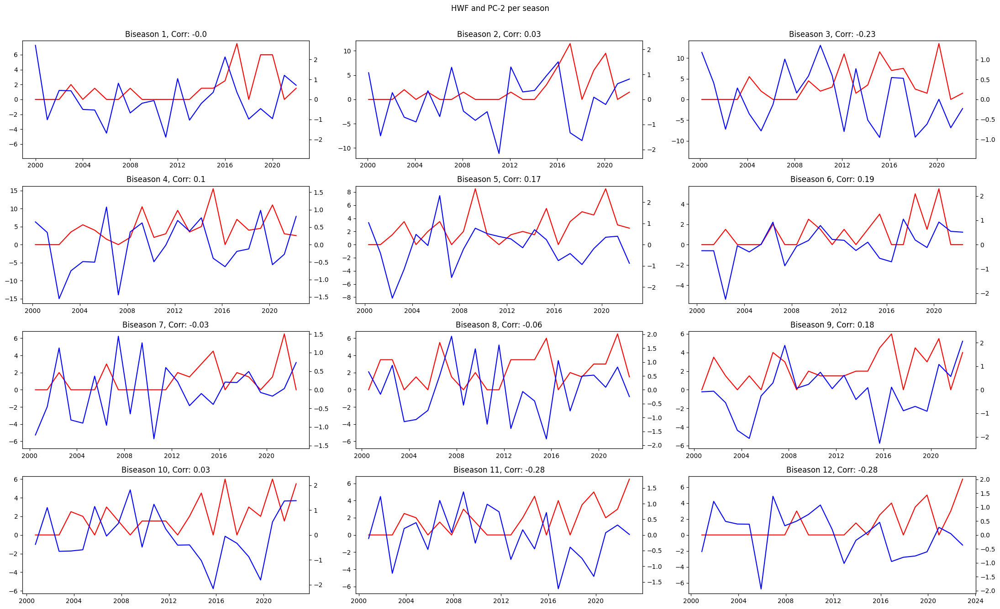

In [ ]:
plot_hw_index_by_season(hwis, "HWF", south_pca, 2, start=2000)

### Box using [250,290,-70,0]

c:\Users\marti\Desktop\data\hw_extra\functions\IndexDrivers.py:84: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  self.grid_shape = (self.data.dims["latitude"], self.data.dims["longitude"])


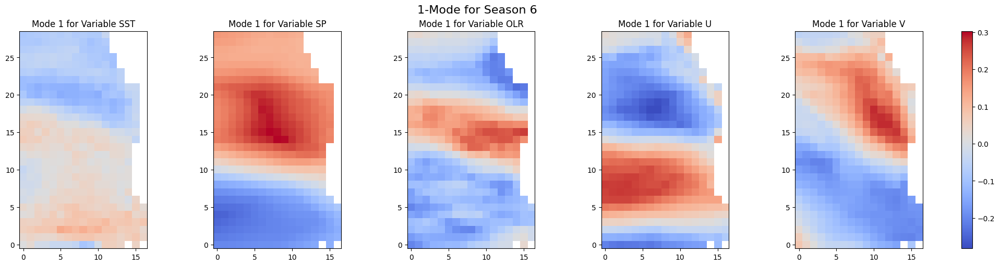

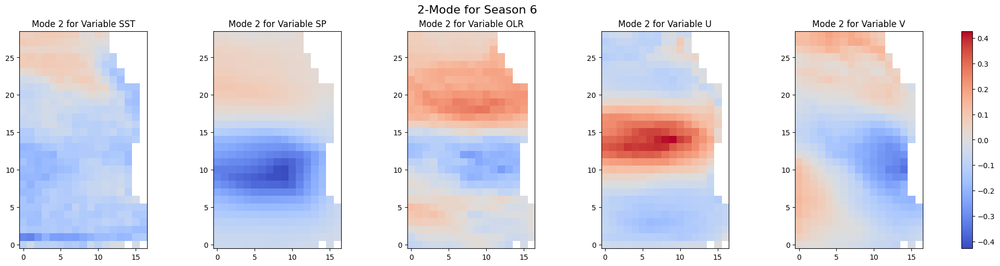

In [ ]:
ds_world = xr.load_dataset("data/local_data/5means_world.nc")
east_pca = MultivariatePCA(ds_world, 2, [1980,2022], box_limit=[250,290,-70,0])
east_pca.plot_variable_modes_shared(6)

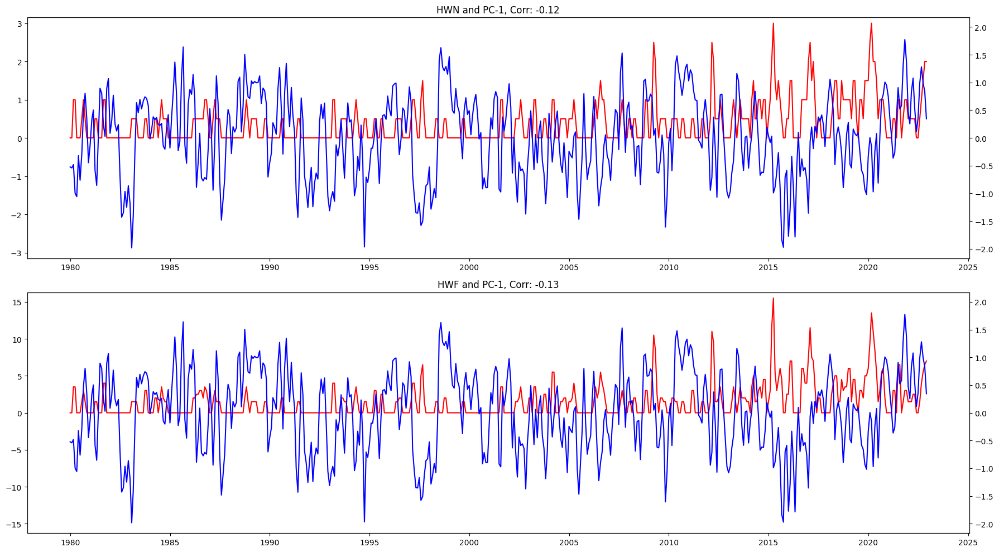

In [ ]:
plot_hw_index(hwis, ["HWN", "HWF"], east_pca, 1)

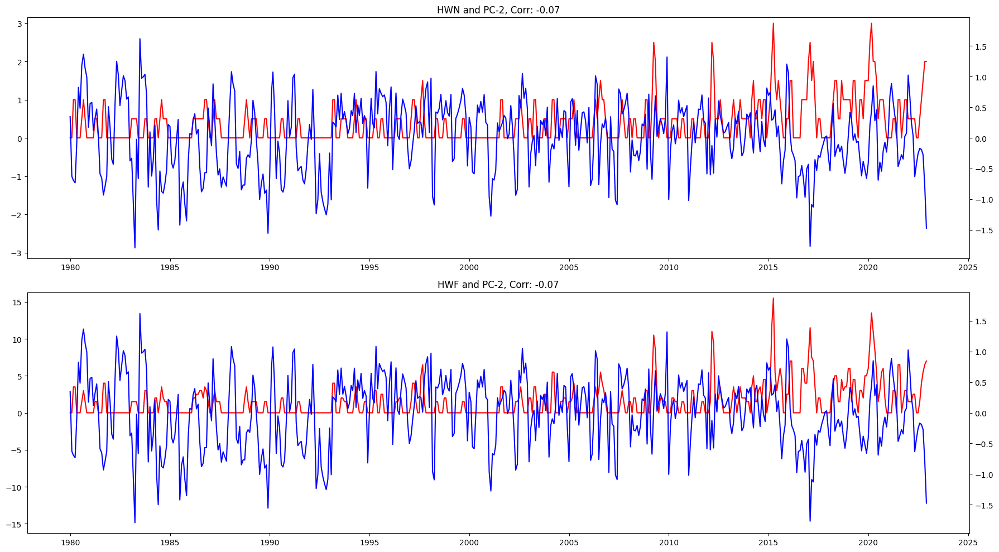

In [ ]:
plot_hw_index(hwis, ["HWN", "HWF"], east_pca, 2)

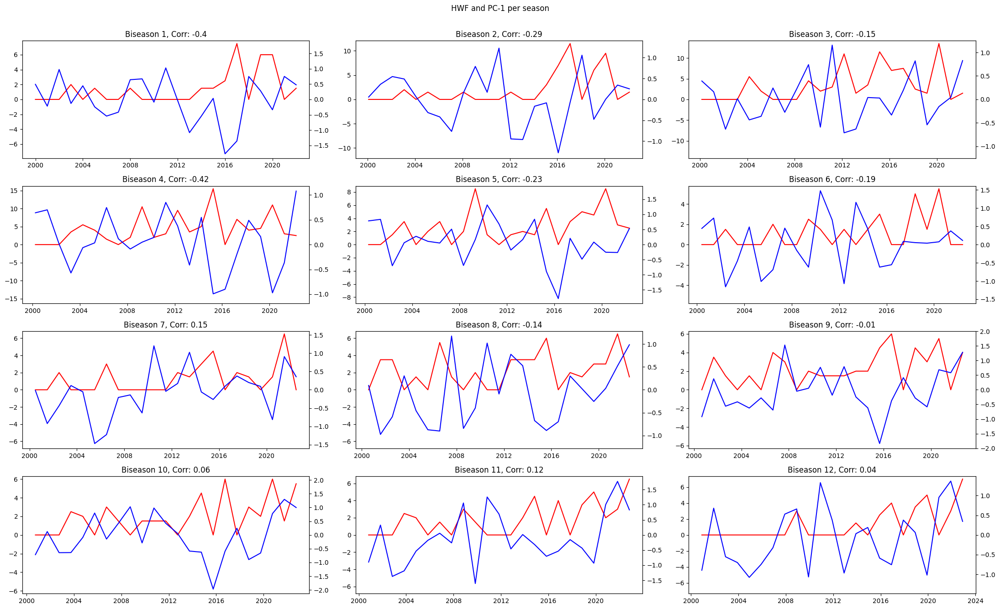

In [ ]:
plot_hw_index_by_season(hwis, "HWF", east_pca, 1, start=2000)

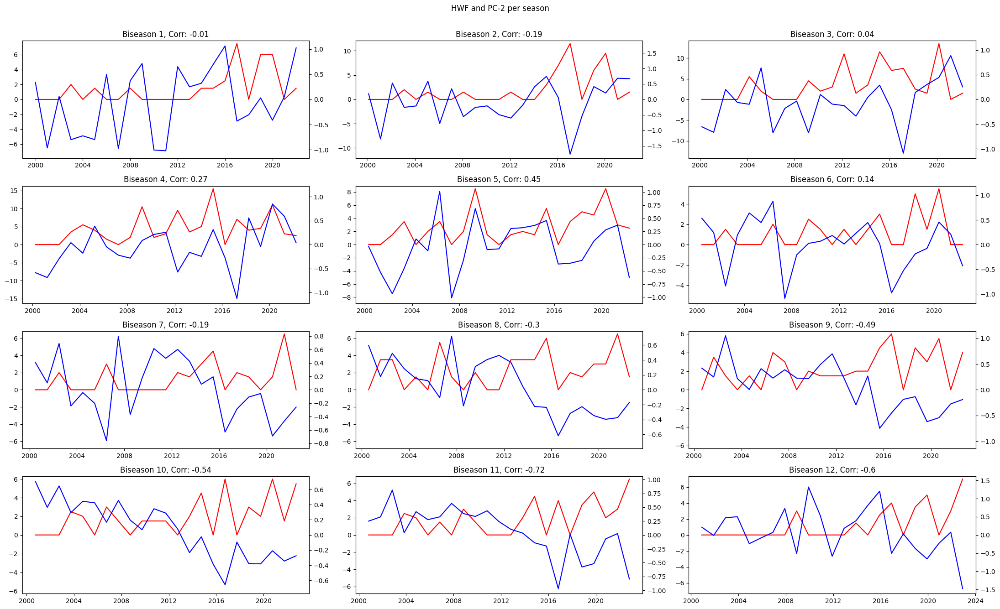

In [ ]:
plot_hw_index_by_season(hwis, "HWF", east_pca, 2, start=2000)

- Try PCA only with SP
- Grid from 9 boxes over the Pacific and try PCA

- Check cluster for different dataset and their variables, we need to know if we can check detection of el niño using these datasets